In [1]:
suppressMessages(library(ggplot2))
suppressMessages(library(ArchR))
suppressMessages(library(Seurat))
suppressMessages(library(Signac))
suppressMessages(library(purrr))
suppressMessages(library(readr))

In [2]:
set.seed(42)
addArchRThreads(threads = 64)

Setting default number of Parallel threads to 64.



In [3]:
proj <- loadArchRProject("./ArchRProject_T", showLogo = FALSE)

Successfully loaded ArchRProject!



In [4]:
proj <- addImputeWeights(proj)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-15446244a611cd-Date-2025-03-18_Time-14-28-10.930945.log
If there is an issue, please report to github with logFile!



2025-03-18 14:28:11.120797 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.

Filtering 1 dims correlated > 0.75 to log10(depth + 1)



In [5]:
batches <- c("10N", '10T', '11T', '12N', '12T', '13T', '19T', '20T', '21T', '22T')
# 为每个批次生成文件名
files <- paste0("/data/xwt/BCY-pair/predictedCellType/", batches, "_immune-subtype.csv")

# 读取并合并所有的csv文件
df <- files %>% 
  map_df(read_csv)

New names:
• `` -> `...1`
Rows: 2069 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (2): ...1, predicted.id
dbl (1): prediction.score.max

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 196 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (2): ...1, predicted.id
dbl (1): prediction.score.max

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 3384 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (2): ...1, predicted.id
dbl (1): prediction.score.max

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify th


FALSE  TRUE 
22771  2781 


FALSE  TRUE 
15947  9605 

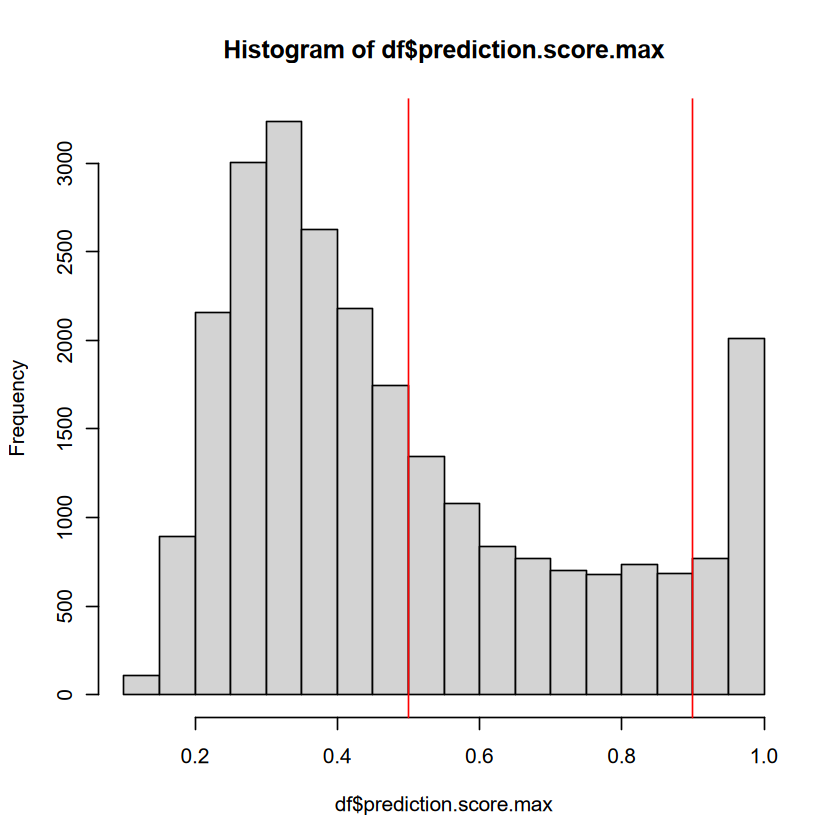

In [6]:
# 过滤掉标签预测质量差的
table(df$prediction.score.max>0.9)
table(df$prediction.score.max>0.5)
hist(df$prediction.score.max) 
abline(v = 0.9, col = "red") 
abline(v = 0.5, col = "red") 

In [7]:
colnames(df)[1] <- "cell"
df <- subset(df, subset = prediction.score.max > 0.5)

In [8]:
# 将预测的细胞类型添加到ArchR项目的cellColData中
proj@cellColData$immune_predictedCellType <- df$predicted.id[match(rownames(proj@cellColData), df$cell)]

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-15446272d5aad7-Date-2025-03-18_Time-14-28-32.50818.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-15446272d5aad7-Date-2025-03-18_Time-14-28-32.50818.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-15446278bf5931-Date-2025-03-18_Time-14-28-32.966659.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-15446278bf5931-Date-2025-03-18_Time-14-28-32.966659.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-15446234d273eb-Date-2025-03-18_Time-14-28-33.311352.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-15446234d273eb-Date-2025-03-18_Time-14-28-33.311352.log



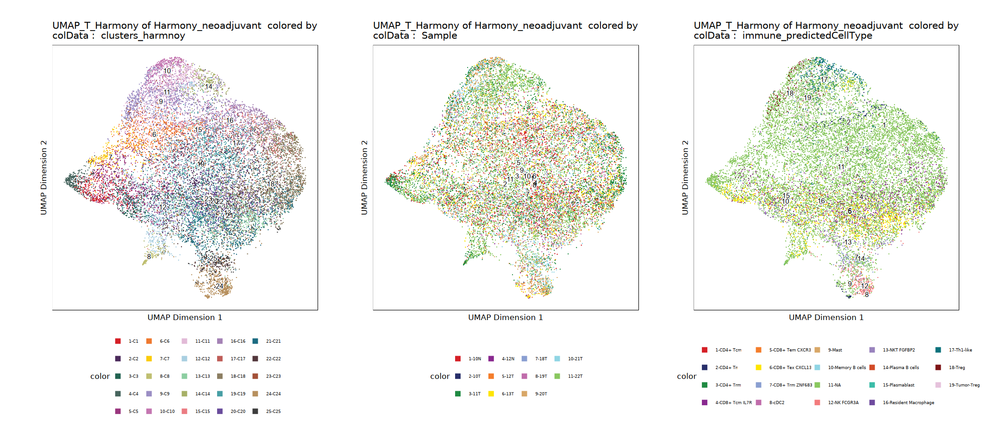

In [9]:
## 可视化
options(repr.plot.height = 8, repr.plot.width = 18)
p1 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "clusters_harmnoy", 
    embedding = "UMAP_T_Harmony"
    )

p2 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "Sample", 
    embedding = "UMAP_T_Harmony"
    )

p3 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "immune_predictedCellType", 
    embedding = "UMAP_T_Harmony"
    )
ggAlignPlots(p1,p2, p3, type = "h")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1544625715e5a8-Date-2025-03-18_Time-14-28-42.540705.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 




ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1544625715e5a8-Date-2025-03-18_Time-14-28-42.540705.log



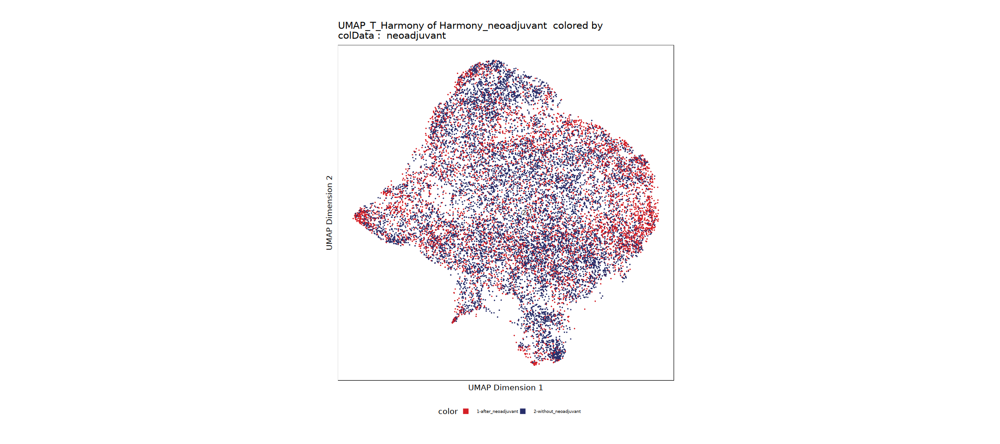

In [10]:
p4 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "neoadjuvant", 
    embedding = "UMAP_T_Harmony"
    )
p4

### 主要免疫细胞亚型及其marker基因
1. majorType中免疫细胞亚型
 - T Cells（T细胞）

    CD4+ T Cells: CD3, CD4, IL7R
    CD8+ T Cells: CD3, CD8A, CD8B, GZMB
    Regulatory T Cells (Tregs): FOXP3, IL2RA (CD25), CTLA4
    Th1 Cells: TBX21 (T-bet), IFNG
    Th2 Cells: GATA3, IL4
    Th17 Cells: RORC, IL17A

 - B Cells（B细胞）

    Naive B Cells: CD19, MS4A1 (CD20), IGHM
    Memory B Cells: CD19, MS4A1 (CD20), CD27, IGHG1
    Plasma Cells: CD38, CD138 (SDC1), XBP1

 - Myeloid Cells（髓系细胞）

    Monocytes: CD14, FCGR3A (CD16), LYZ
    Macrophages: CD68, CD163, MRC1
    Dendritic Cells: ITGAX (CD11c), HLA-DRA, CD1C, CLEC9A (for cDC1), CD1C (for cDC2)
    Myeloid-Derived Suppressor Cells (MDSCs): CD33, ARG1, S100A8/S100A9

 - Mast Cells（肥大细胞）

    Markers: KIT (CD117), FCER1A, TPSAB1 (tryptase), CPA3

 - Plasmablasts（浆母细胞）

    Markers: CD19, CD27, CD38, MZB1, IGJ, XBP1
 

2. 是否需要分出ILCs类型

ILCs（先天淋巴细胞）包括ILC1、ILC2、ILC3和NK细胞，它们在免疫反应中起重要作用。如果你的数据中包含了这些细胞类型，并且它们在乳腺癌免疫微环境中可能发挥关键作用，那么分出ILCs类型是有意义的。ILCs的常见marker基因如下：

    ILC1: TBX21 (T-bet), IFNG, CD127, CD117（低表达）
    ILC2: GATA3, IL5, IL13, CD127, IL1RL1 (ST2)
    ILC3: RORC, IL17A, IL22, CD127, CD117（高表达）

如果决定分出ILCs类型，可以在marker基因列表中添加这些基因，并相应地进行注释。

#### 细分T细胞，分为CD8+ CDD4+ NK

In [11]:
# markerGenes
markerGenes <- c(
  "CD3D", "CD3E" # T cells
)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1544622a9613a6-Date-2025-03-18_Time-14-28-45.57326.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:28:45.774472 : 





Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1544622a9613a6-Date-2025-03-18_Time-14-28-45.57326.log

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.”


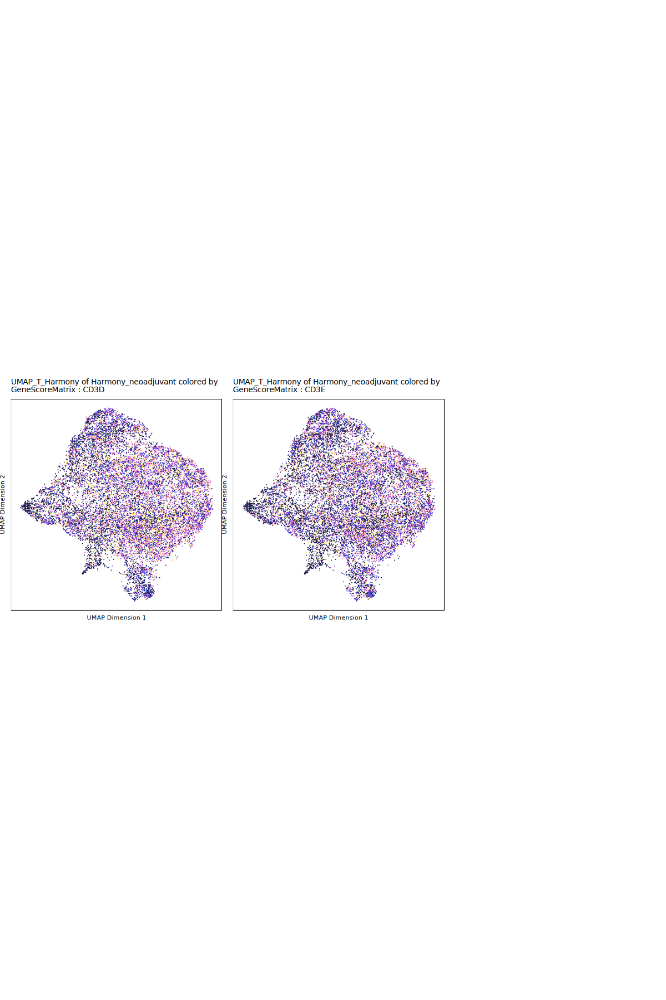

In [12]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1544623af7f258-Date-2025-03-18_Time-14-28-53.673802.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:28:53.872187 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1544623af7f258-Date-2025-03-18_Time-14-28-53.673802.log



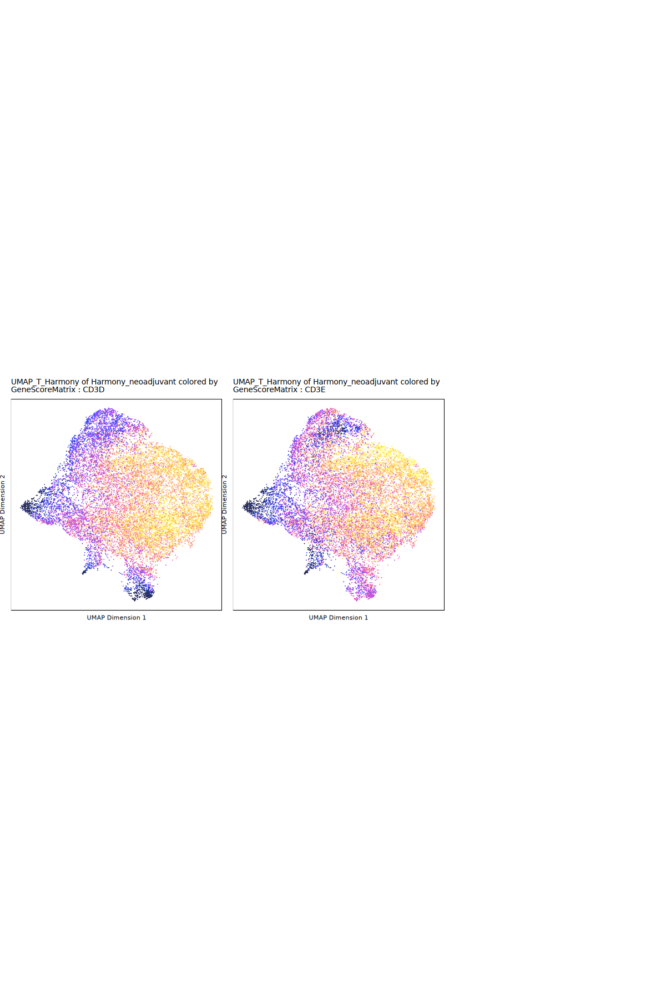

In [13]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-15446270c1f0b9-Date-2025-03-18_Time-14-29-03.456708.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:29:03.653984 : 





Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-15446270c1f0b9-Date-2025-03-18_Time-14-29-03.456708.log



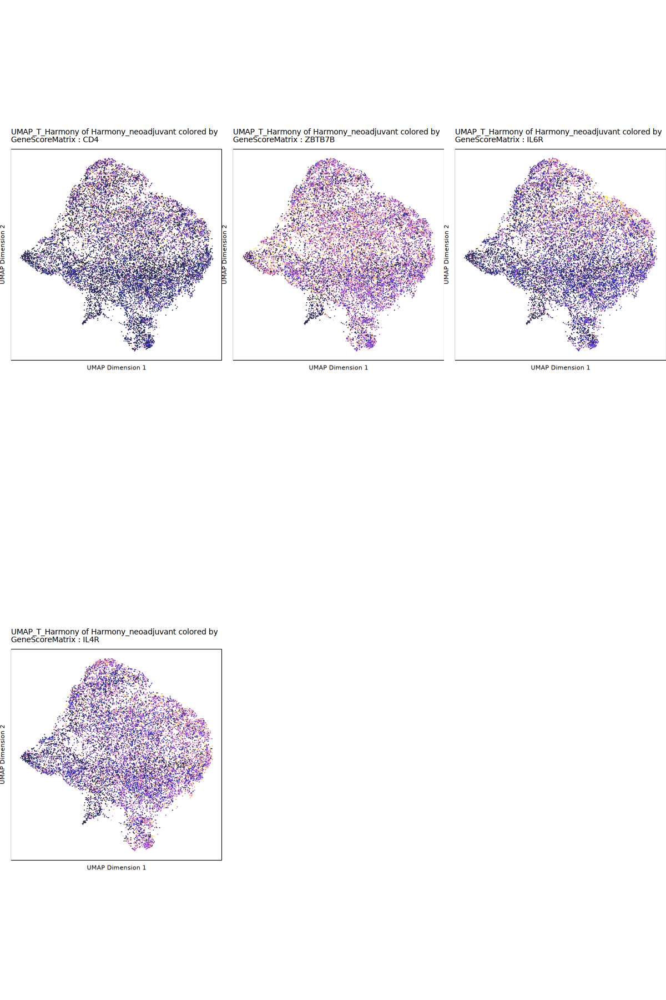

In [14]:
# CD4+ T cells
markerGenes <- c(
  "CD4", "ZBTB7B", "IL6R", "IL4R"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1544625a0c6046-Date-2025-03-18_Time-14-29-16.658105.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:29:16.859037 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1544625a0c6046-Date-2025-03-18_Time-14-29-16.658105.log



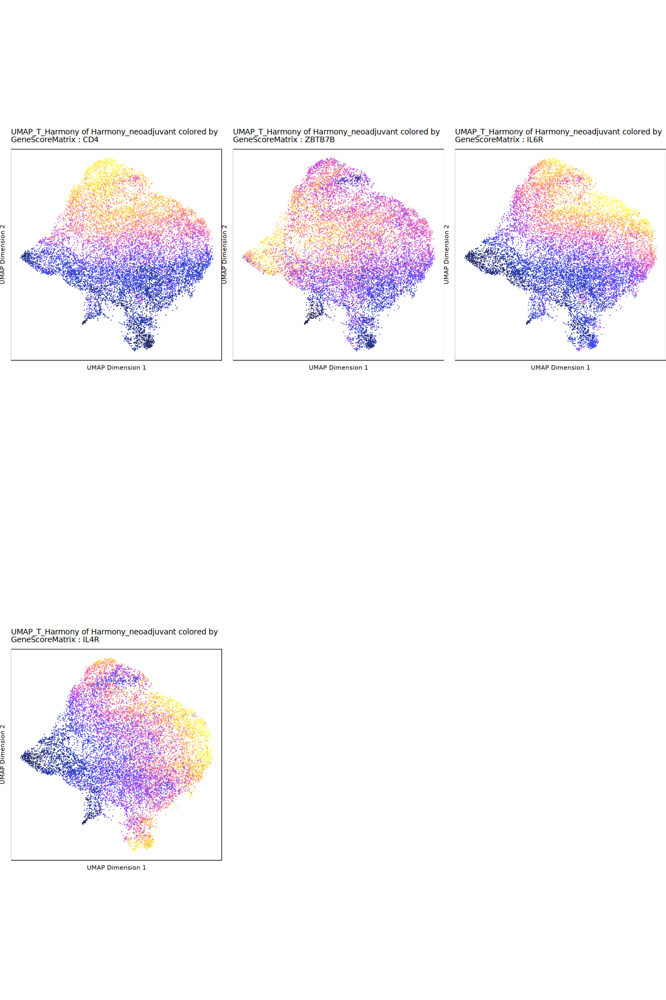

In [15]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-154462200f759d-Date-2025-03-18_Time-14-29-30.478663.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix



Getting Matrix Values...

2025-03-18 14:29:30.681329 : 



Plotting Embedding

1 
2 
3 
4 
5 
6 
7 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-154462200f759d-Date-2025-03-18_Time-14-29-30.478663.log



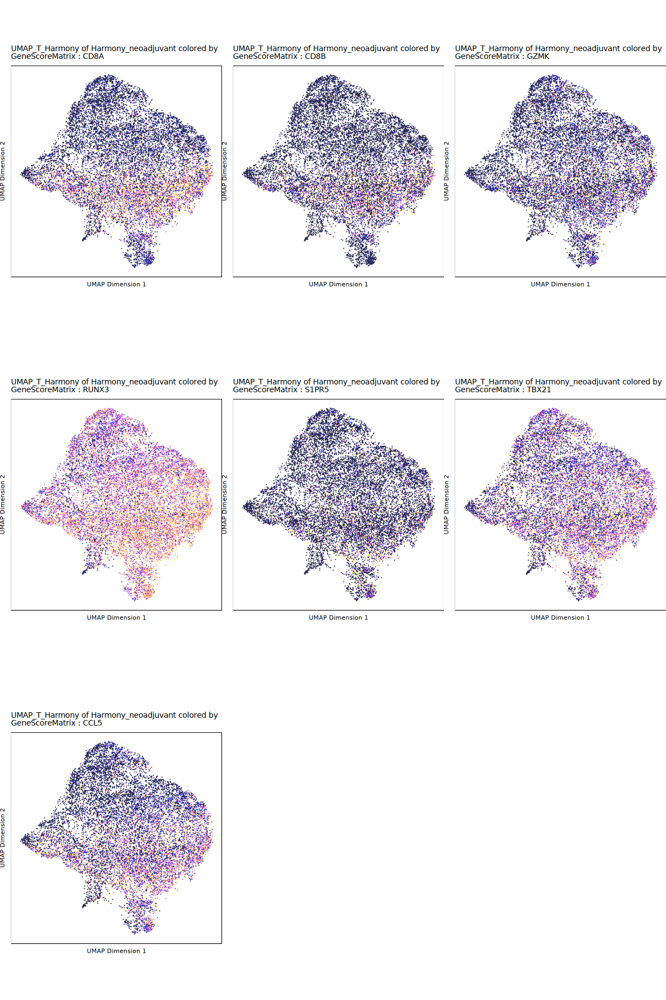

In [16]:
# CD8+ T cells
markerGenes <- c(
  "CD8A", "CD8B", "GZMK", "RUNX3", "S1PR5", "TBX21", "CCL5"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1544621711dc29-Date-2025-03-18_Time-14-29-48.419583.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:29:48.614228 : 





Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1544621711dc29-Date-2025-03-18_Time-14-29-48.419583.log



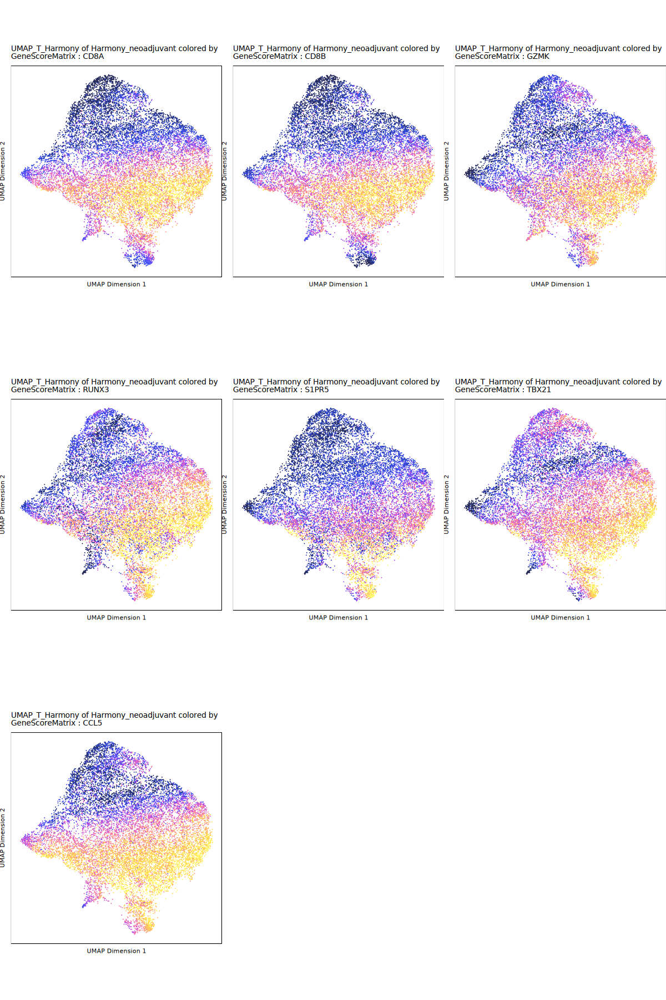

In [17]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1544625a24f0b5-Date-2025-03-18_Time-14-30-06.730099.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:30:06.931288 : 





Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1544625a24f0b5-Date-2025-03-18_Time-14-30-06.730099.log



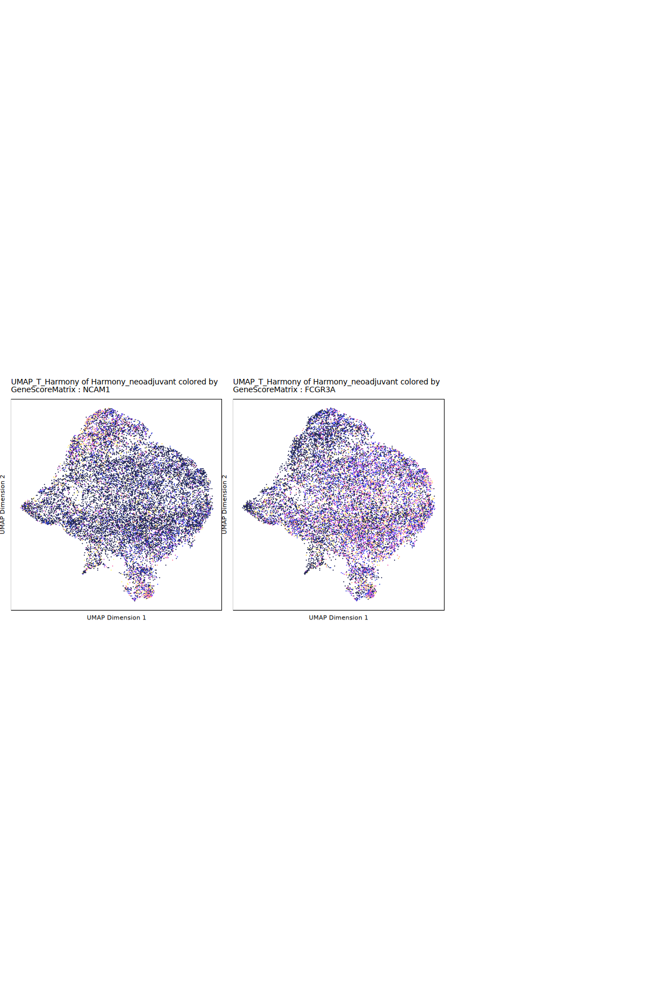

In [18]:
# NK cells
markerGenes <- c(
  "NCAM1","FCGR3A"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-15446223779801-Date-2025-03-18_Time-14-30-12.973114.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:30:13.149349 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-15446223779801-Date-2025-03-18_Time-14-30-12.973114.log



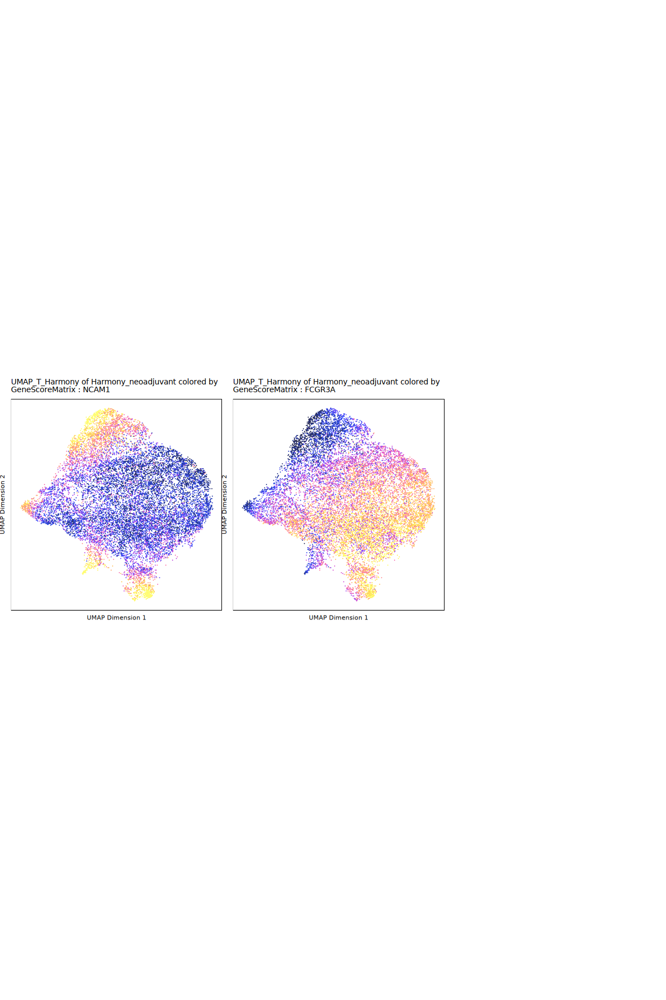

In [19]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-154462718e0f78-Date-2025-03-18_Time-14-30-25.405444.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:30:25.614837 : 



Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-154462718e0f78-Date-2025-03-18_Time-14-30-25.405444.log



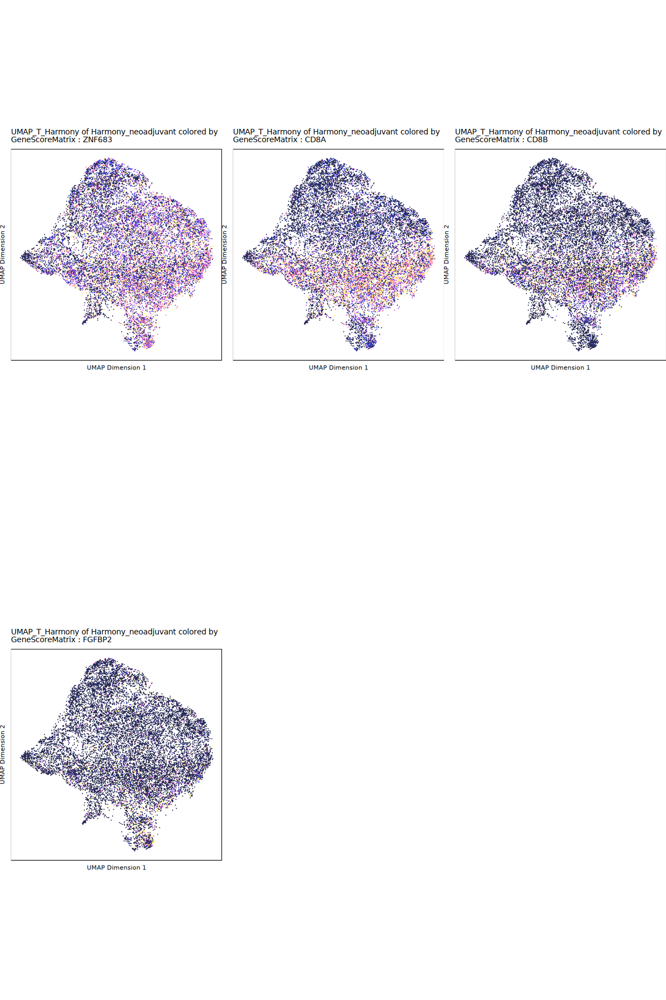

In [20]:
# NKT cells
markerGenes <- c(
    "ZNF683", "CD8A", "CD8B","FGFBP2"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1544624a5adb3a-Date-2025-03-18_Time-14-30-34.621288.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:30:34.826293 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1544624a5adb3a-Date-2025-03-18_Time-14-30-34.621288.log



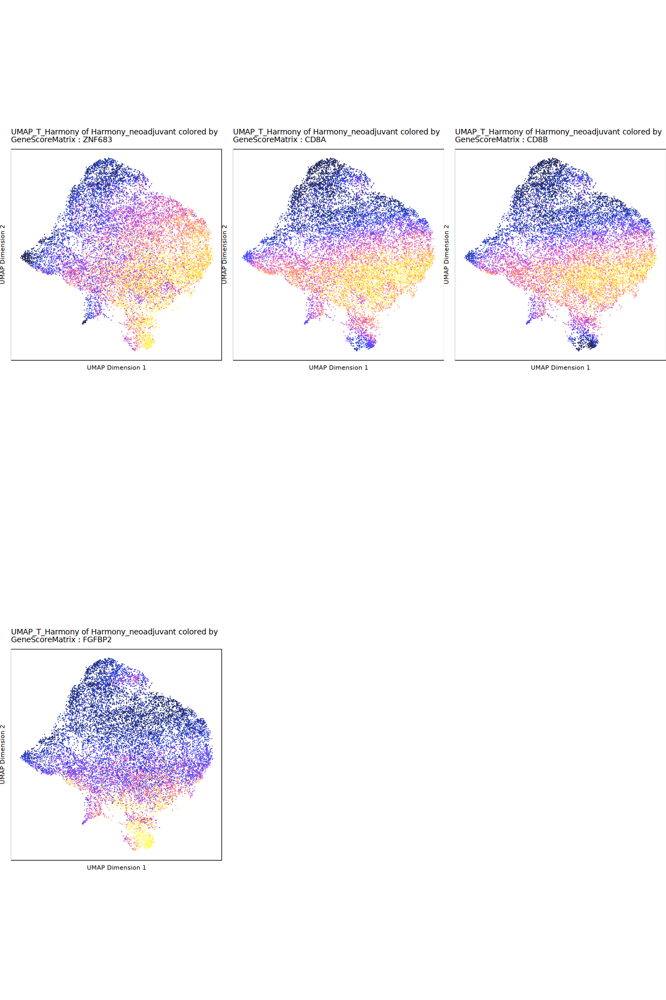

In [21]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-15446213bfffa9-Date-2025-03-18_Time-14-30-48.679566.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:30:48.864218 : 



Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-15446213bfffa9-Date-2025-03-18_Time-14-30-48.679566.log



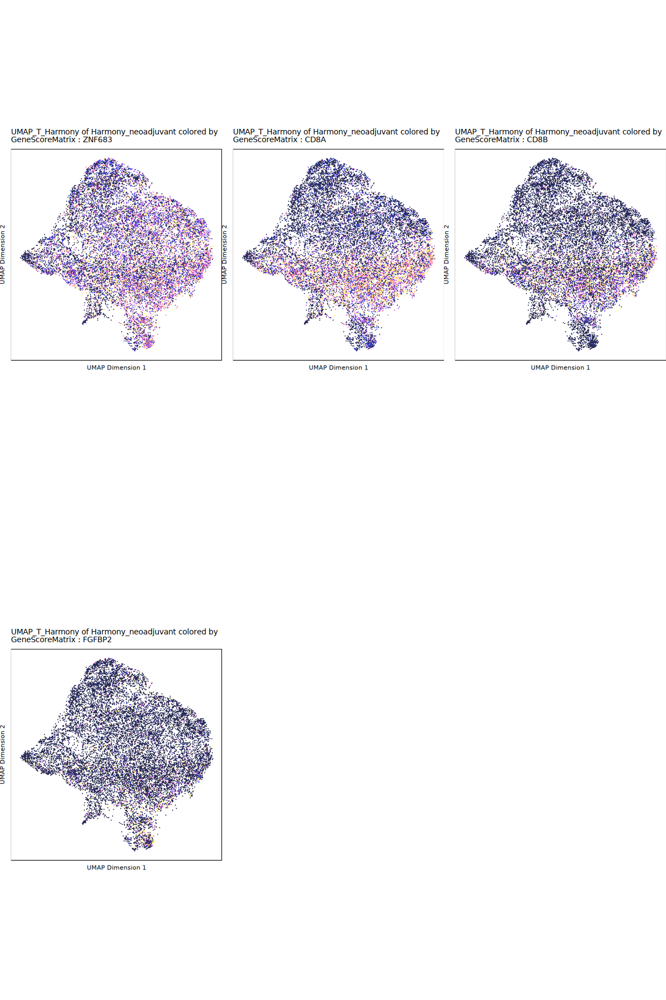

In [22]:
# NKT cells
markerGenes <- c(
    "ZNF683", "CD8A", "CD8B","FGFBP2"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1544626a83e4eb-Date-2025-03-18_Time-14-36-20.929805.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-18 14:36:21.139542 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1544626a83e4eb-Date-2025-03-18_Time-14-36-20.929805.log



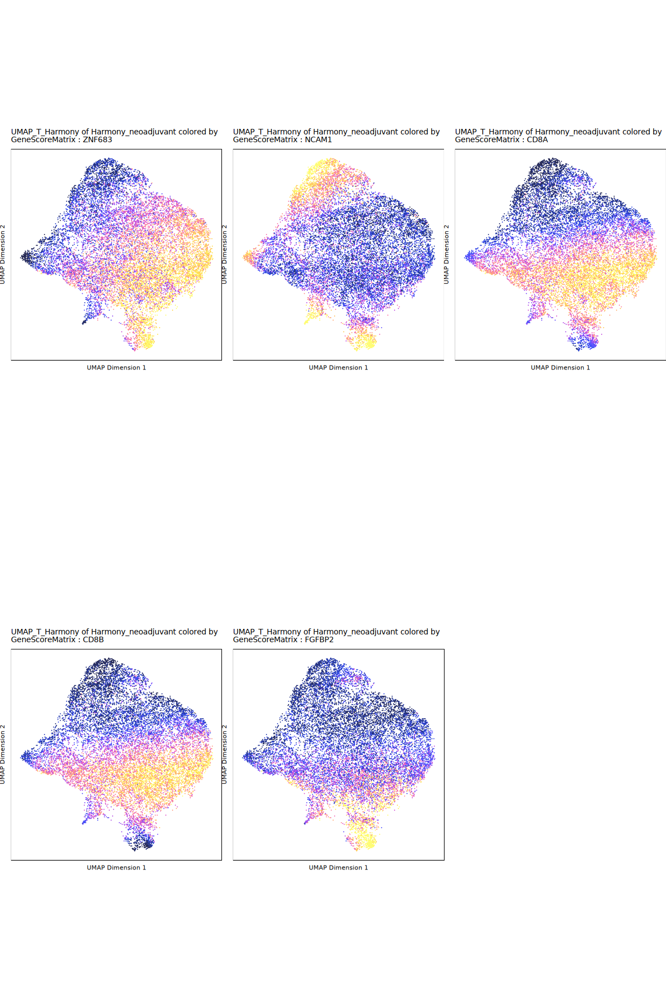

In [27]:
# NKT cells
markerGenes <- c(
    "ZNF683","NCAM1", "CD8A", "CD8B","FGFBP2"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-1544623154989e-Date-2025-03-18_Time-14-30-57.339946.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix



Getting Matrix Values...

2025-03-18 14:30:57.519643 : 



Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-1544623154989e-Date-2025-03-18_Time-14-30-57.339946.log



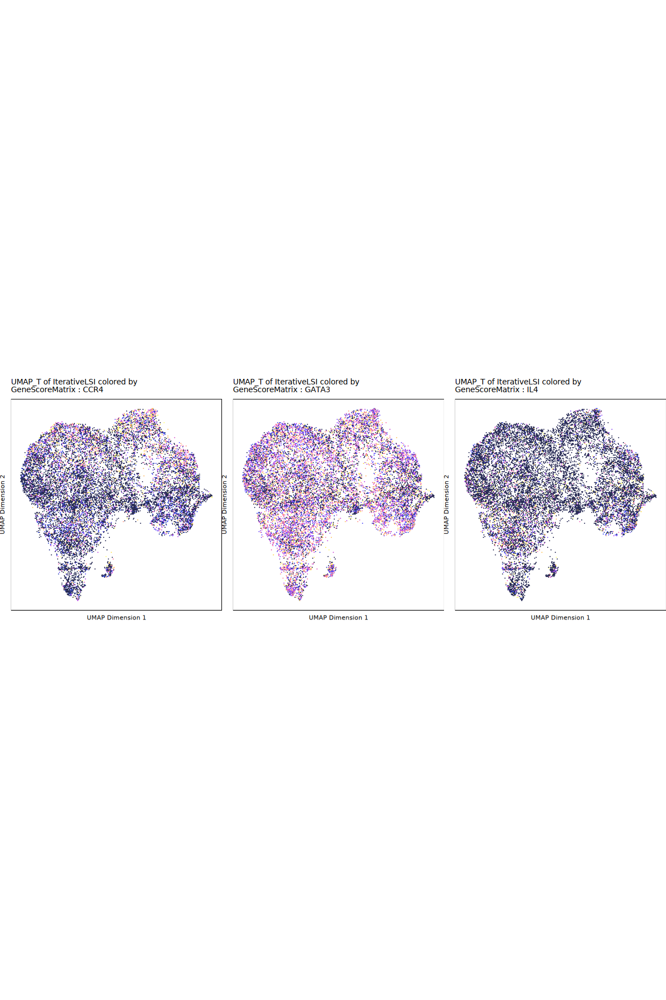

In [23]:
# Th2
markerGenes <- c(
  "CCR4", "GATA3", "IL4"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_T",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

In [24]:
markersGS <- readRDS(file = "./ArchRProject_T/markersGS_Tclusters.rds")

In [25]:
## 后续图 - 基于clusters
### marker gene基因活性
# Heatmap
## marker genes, 根据05_01_annotation中的显著表达来确定绘图的marker genes
markerGenes <- c(
  "CD4", "ZBTB7B", "IL6R", "IL4R", # CD4
  "CD8A", "CD8B", "GZMK", "RUNX3", "S1PR5", "TBX21", "CCL5", # CD8
  "NCAM1","FCGR3A", # NK
  "ZNF683", "FGFBP2" , "CD3D"# NKT
    
)

## 绘制只有marker基因的热图，Mean GS z-score

### 提取差异基因中在marker genes中的基因
idx <- which(mcols(markersGS)$name %in% markerGenes)
### 提取指定行，为矩阵
mtx <- assays(markersGS[idx,])$Mean %>% `rownames<-`(., mcols(markersGS)$name[idx])
### 标准化（z-score），并转置
mtx <- t(scale(t(mtx)))
### 定义层次聚类函数de
fh <- function(x) hclust(dist(x), method="ward.D2")
### 定义颜色函数
col_fun1 <- colorRamp2(c(-2,-1,0,1,2), paletteContinuous(set = "horizonExtra", n = 5))
options(repr.plot.width = 10, repr.plot.height = 10)
ht1 <- Heatmap(mtx, name = "Mean GS z-score", cluster_rows = fh, cluster_columns = F, show_row_dend = F, col = col_fun1)
p3 <- draw(ht1)
p3

ERROR: Error in colorRamp2(c(-2, -1, 0, 1, 2), paletteContinuous(set = "horizonExtra", : could not find function "colorRamp2"


In [ ]:
# markerGenes
markerGenes <- c(
  "CD19", "MS4A1", "IGHM", "CD27", "IGHG1", "CD38", "SDC1" # B cells
)

In [ ]:
# markerGenes
markerGenes <- c(
  "CD14", "FCGR3A", "LYZ", "CD68", "CD163", "MRC1", "ITGAX", "HLA-DRA" # Myeloid cells
)

In [ ]:
# markerGenes
markerGenes <- c(
  "KIT", "FCER1A", "TPSAB1", "CPA3" # Mast cells
)

In [ ]:
# markerGenes
markerGenes <- c(
  "MZB1", "IGJ", "XBP1" # Plasmablasts
)

In [ ]:
# markerGenes
markerGenes <- c(
  "TBX21", "IFNG", # ILC1
  "GATA3", "IL5", "IL13", "IL1RL1", # ILC2
  "RORC", "IL17A", "IL22", "KIT" # ILC3
)